# COVID19 - District Region of Sao Paulo State, Brazil

In [1]:
from environs import Env
env = Env()
env.str("CUDA_DEVICE_ORDER",'PCI_BUS_ID')
env.int("CUDA_VISIBLE_DEVICES",1)
env.int("NUMBA_ENABLE_CUDASIM",1)
env.bool("OMPI_MCA_opal_cuda_support",True)

import os
import ray

In [2]:
import urllib.request
import pandas as pd
import numpy as np
from datetime import datetime,timedelta

In [3]:
# Download data
import get_data
LoadData=True

if LoadData:
    get_data.get_data()

Baixando arquivos brasil.io...


In [4]:
dfSP = pd.read_csv("data/dados_municipios_SP.csv")
dfSP
dfSP.query('DRS == "{}"'.format('DRS 01 - Grande São Paulo'))

,date,state,city,place_type,confirmed,deaths,order_for_place,is_last,popEst,city_ibge_code,confirmed_per_100k_inhabitants,death_rate,DRS
4822,2020-09-09,SP,Arujá,city,1662,73,161,True,89824.0,3503901.0,1850.28500,0.0439,DRS 01 - Grande São Paulo
4823,2020-09-04,SP,Arujá,city,1616,72,160,False,89824.0,3503901.0,1799.07374,0.0446,DRS 01 - Grande São Paulo
4824,2020-09-03,SP,Arujá,city,1609,72,159,False,89824.0,3503901.0,1791.28073,0.0447,DRS 01 - Grande São Paulo
4825,2020-09-02,SP,Arujá,city,1599,71,158,False,89824.0,3503901.0,1780.14784,0.0444,DRS 01 - Grande São Paulo
4826,2020-09-01,SP,Arujá,city,1592,70,157,False,89824.0,3503901.0,1772.35483,0.0440,DRS 01 - Grande São Paulo
...,...,...,...,...,...,...,...,...,...,...,...,...,...
78351,2020-03-30,SP,Vargem Grande Paulista,city,2,1,5,False,52597.0,3556453.0,3.80250,0.5000,DRS 01 - Grande São Paulo
78352,2020-03-27,SP,Vargem Grande Paulista,city,2,1,4,False,52597.0,3556453.0,3.80250,0.5000,DRS 01 - Grande São Paulo
78353,2020-03-26,SP,Vargem Grande Paulista,city,1,1,3,False,52597.0,3556453.0,1.90125,1.0000,DRS 01 - Grande São Paulo
78354,2020-03-25,SP,Vargem Grande Paulista,city,0,1,2,False,52597.0,3556453.0,NaN,0.0000,DRS 01 - Grande São Paulo


In [5]:
# Model

In [6]:
# lista DRSs
DRS = list(dfSP["DRS"].unique())
DRS.remove("Indefinido")
DRS

['DRS 09 - Marília',
 'DRS 15 - São José do Rio Preto',
 'DRS 14 - São João da Boa Vista',
 'DRS 06 - Bauru',
 'DRS 16 - Sorocaba',
 'DRS 11 - Presidente Prudente',
 'DRS 05 - Barretos',
 'DRS 13 - Ribeirão Preto',
 'DRS 02 - Araçatuba',
 'DRS 07 - Campinas',
 'DRS 03 - Araraquara',
 'DRS 10 - Piracicaba',
 'DRS 17 - Taubaté',
 'DRS 08 - Franca',
 'DRS 01 - Grande São Paulo',
 'DRS 12 - Registro',
 'DRS 04 - Baixada Santista']

# SEAIR-D Model Equations

$$\begin{array}{l}\frac{d s}{d t}=-[\beta i(t) + \beta_2 a(t)-\mu] \cdot s(t)\\ 
\frac{d e}{d t}=[\beta i(t) + \beta_2 a(t)] \cdot s(t) -(\sigma+\mu) \cdot e(t)\\ 
\frac{d a}{d t}=\sigma e(t) \cdot (1-p)-(\gamma+\mu) \cdot a(t) \\
\frac{d i}{d t}=\sigma e(t) \cdot p - (\gamma + \sigma_2 + \sigma_3 + \mu) \cdot i(t)\\ 
\frac{d r}{d t}=(b + \sigma_2) \cdot i(t) + \gamma \cdot a(t) - \mu \cdot r(t)\\
\frac{d k}{d t}=(a + \sigma_3 - \mu) \cdot d(t)
\end{array}$$

The sum of all people accounted is equal to population considered:

$$s + e + a + i + r + k = N$$

The derivate is:

$$\frac{d s}{d t}+\frac{d e}{d t}+\frac{d a}{d t}+\frac{d i}{d t}+\frac{d r}{d t}+\frac{d k}{d t} = 0$$

The last equation does not need to be solve because:

$$\frac{d k}{d t}=-(\frac{d s}{d t}+\frac{d e}{d t}+\frac{d a}{d t}+\frac{d i}{d t}+\frac{d r}{d t})$$

The sum of all rates are equal to zero! The importance of this equation is that it conservates the rates.


## Parameters

N: the population considered

$\beta$: Effective contact rate [1/min]
    
$\gamma$: Recovery(+Mortality) rate $\gamma=(a+b)$ [1/min]

$a$: mortality of healed  [1/min]

$b$: recovery rate  [1/min]

$\sigma$: is the rate at which individuals move from the exposed to the infectious classes. Its reciprocal ($1/\sigma$) is the average latent (exposed) period.

$\sigma_2$: is the rate at which individuals move from the infectious to the healed classes. Its reciprocal ($1/\sigma_2$) is the average latent (exposed) period

$\sigma_3$: is the rate at which individuals move from the infectious to the dead classes. Its reciprocal ($1/\sigma_3$) is the average latent (exposed) period
    
$p$: is the fraction of the exposed which become symptomatic infectious sub-population.

$(1-p)$: is the fraction of the exposed which becomes asymptomatic infectious sub-population.

## Options: Param.CSV file, changeCSV, Adjust Param, Save CSV, Select Specific DRS

In [7]:
from IPython.display import display, HTML, Markdown

paramOpt=6
changeCSV=True
adjustParam=False
paramSave=False
selectDRS=False

## Different Options to Load Param.CSV file

In [8]:
if paramOpt==0:
    paramFile="data/param.csv"
    version = "1"
    model = "ManualIC"
    
if paramOpt==1:
    paramFile="data/param_optimized_Yabox_HistMin-Copy1.csv"
    version = "106"
    model = "YaboxICAdjusted"

if paramOpt==2:
    paramFile="data/param_optimized_Yabox_HistMin-Copy2.csv.csv"
    version = "107"
    model = "YaboxICAdjusted"
    
if paramOpt==3 or paramOpt==4:
    paramFile="data/param_optimized_Yabox_HistMin-Copy3.csv"
    version = "107"
    model = "YaboxICAdjusted"
    
if paramOpt==5 or paramOpt==6:
    paramFile="data/param_optimized_Yabox_HistMin.csv"
    version = "109"
    model = "YaboxIC"    

In [9]:
dfparam = pd.read_csv(paramFile)
dfparam = dfparam.dropna()
dfparam.e0=0
dfparam.r0=0

display(Markdown("## Original Initial Parameters"))
display(dfparam)

## Original Initial Parameters

,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC
0,DRS 01 - Grande São Paulo,2020-03-20,200,6094427,0,0,40,0,92,134,0.15,0.5041,0.0081
1,DRS 02 - Araçatuba,2020-03-30,200,219623,0,0,62,0,4,21,0.15,0.4729,0.0083
2,DRS 03 - Araraquara,2020-04-01,200,208565,0,0,79,0,66,56,0.15,0.5070,0.0108
3,DRS 04 - Baixada Santista,2020-04-02,200,538769,0,0,198,0,34,2,0.15,0.5412,0.0017
4,DRS 05 - Barretos,2020-04-01,200,108081,0,0,94,0,52,15,0.15,0.4928,0.0332
5,DRS 06 - Bauru,2020-04-01,200,265879,0,0,144,0,50,40,0.15,0.4900,0.0093
6,DRS 07 - Campinas,2020-03-30,200,1319214,0,0,178,0,68,38,0.15,0.5210,0.0115
7,DRS 08 - Franca,2020-03-31,200,60912,0,0,80,0,78,140,0.15,0.4564,0.0301
8,DRS 09 - Marília,2020-04-01,200,324404,0,0,197,0,59,83,0.15,0.5232,0.0186
9,DRS 10 - Piracicaba,2020-04-01,200,301293,0,0,248,0,84,149,0.15,0.4061,0.0234


## Modify param.csv file to fit better the data

In [10]:
if changeCSV and paramOpt==1:
    dfparam['s0'] = pd.to_numeric(dfparam['s0'],errors='coerce')
    dfparam['i0'] = pd.to_numeric(dfparam['i0'],errors='coerce')
    dfparam['d0'] = pd.to_numeric(dfparam['d0'],errors='coerce')
    dfparam['s0'] = dfparam['s0'].astype(float)
    dfparam['i0'] = dfparam['i0'].astype(float)
    dfparam['d0'] = dfparam['d0'].astype(float)
    dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','s0'] = dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','s0'].values[0]*1.1
    dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','i0'] = dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','i0']*.1
    dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','d0'] = dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','d0']*.5
    dfparam.loc[dfparam.DRS=='DRS 02 - Araçatuba','s0'] = dfparam.loc[dfparam.DRS=='DRS 02 - Araçatuba','s0']*3*2
    dfparam.loc[dfparam.DRS=='DRS 02 - Araçatuba','i0'] = dfparam.loc[dfparam.DRS=='DRS 02 - Araçatuba','i0']*.2*0.3
    dfparam.loc[dfparam.DRS=='DRS 02 - Araçatuba','d0'] = dfparam.loc[dfparam.DRS=='DRS 02 - Araçatuba','d0']*0.9
    dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','i0'] = dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','i0']*.2
    dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','d0'] = dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 04 - Baixada Santista','s0'] = dfparam.loc[dfparam.DRS=='DRS 04 - Baixada Santista','s0']*2.5*1.5
    dfparam.loc[dfparam.DRS=='DRS 05 - Barretos','i0'] = dfparam.loc[dfparam.DRS=='DRS 05 - Barretos','i0']*.1*0.5
    dfparam.loc[dfparam.DRS=='DRS 11 - Presidente Prudente','i0'] = dfparam.loc[dfparam.DRS=='DRS 11 - Presidente Prudente','i0']*.3
    dfparam.loc[dfparam.DRS=='DRS 10 - Piracicaba','i0'] = dfparam.loc[dfparam.DRS=='DRS 10 - Piracicaba','i0']*.3
    dfparam.loc[dfparam.DRS=='DRS 12 - Registro','d0'] = dfparam.loc[dfparam.DRS=='DRS 12 - Registro','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 12 - Registro','i0'] = dfparam.loc[dfparam.DRS=='DRS 12 - Registro','i0']*.1
    dfparam.loc[dfparam.DRS=='DRS 15 - São José do Rio Preto','i0'] = dfparam.loc[dfparam.DRS=='DRS 15 - São José do Rio Preto','i0']*.3
    dfparam.loc[dfparam.DRS=='DRS 16 - Sorocaba','i0'] = dfparam.loc[dfparam.DRS=='DRS 16 - Sorocaba','i0']*.3
    dfparam.loc[dfparam.DRS=='DRS 17 - Taubaté','i0'] = dfparam.loc[dfparam.DRS=='DRS 17 - Taubaté','i0']*.3        

if changeCSV and (paramOpt==2 or paramOpt==4):
    dfparam['s0'] = pd.to_numeric(dfparam['s0'],errors='coerce')
    dfparam['i0'] = pd.to_numeric(dfparam['i0'],errors='coerce')
    dfparam['d0'] = pd.to_numeric(dfparam['d0'],errors='coerce')
    dfparam['s0'] = dfparam['s0'].astype(float)
    dfparam['i0'] = dfparam['i0'].astype(float)
    dfparam['d0'] = dfparam['d0'].astype(float)
    dfparam.loc[dfparam.DRS=='DRS 05 - Barretos','i0'] = dfparam.loc[dfparam.DRS=='DRS 05 - Barretos','i0']*.1
    dfparam.loc[dfparam.DRS=='DRS 11 - Presidente Prudente','i0'] = dfparam.loc[dfparam.DRS=='DRS 11 - Presidente Prudente','i0']*.1
    dfparam.loc[dfparam.DRS=='DRS 12 - Registro','d0'] = dfparam.loc[dfparam.DRS=='DRS 12 - Registro','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 12 - Registro','i0'] = dfparam.loc[dfparam.DRS=='DRS 12 - Registro','i0']*.1 
    
if changeCSV and (paramOpt==3 or paramOpt==4):
    dfparam['s0'] = pd.to_numeric(dfparam['s0'],errors='coerce')
    dfparam['i0'] = pd.to_numeric(dfparam['i0'],errors='coerce')
    dfparam['d0'] = pd.to_numeric(dfparam['d0'],errors='coerce')
    dfparam['s0'] = dfparam['s0'].astype(float)
    dfparam['i0'] = dfparam['i0'].astype(float)
    dfparam['d0'] = dfparam['d0'].astype(float)
    dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','i0'] = dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','i0']*.1
    dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','i0'] = dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','i0']*.1
    dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','d0'] = dfparam.loc[dfparam.DRS=='DRS 14 - São João da Boa Vista','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 15 - São José do Rio Preto','i0'] = dfparam.loc[dfparam.DRS=='DRS 15 - São José do Rio Preto','i0']*.1

if changeCSV and (paramOpt==6):
    dfparam['s0'] = pd.to_numeric(dfparam['s0'],errors='coerce')
    dfparam['i0'] = pd.to_numeric(dfparam['i0'],errors='coerce')
    dfparam['d0'] = pd.to_numeric(dfparam['d0'],errors='coerce')
    dfparam['s0'] = dfparam['s0'].astype(float)
    dfparam['i0'] = dfparam['i0'].astype(float)
    dfparam['d0'] = dfparam['d0'].astype(float)
    dfparam.loc[dfparam.DRS=='DRS 12 - Registro','d0'] = dfparam.loc[dfparam.DRS=='DRS 12 - Registro','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 12 - Registro','i0'] = dfparam.loc[dfparam.DRS=='DRS 12 - Registro','i0']*.5 
    dfparam.loc[dfparam.DRS=='DRS 08 - Franca','d0'] = dfparam.loc[dfparam.DRS=='DRS 08 - Franca','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 01 - Grande São Paulo','s0'] = dfparam.loc[dfparam.DRS=='DRS 01 - Grande São Paulo','s0']*1.2
    dfparam.loc[dfparam.DRS=='DRS 04 - Baixada Santista','s0'] = dfparam.loc[dfparam.DRS=='DRS 04 - Baixada Santista','s0']*2.5
    dfparam.loc[dfparam.DRS=='DRS 04 - Baixada Santista','d0'] = dfparam.loc[dfparam.DRS=='DRS 04 - Baixada Santista','d0']*0.5
    dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','d0'] = dfparam.loc[dfparam.DRS=='DRS 03 - Araraquara','d0']*.1
    dfparam.loc[dfparam.DRS=='DRS 09 - Marília','d0'] = dfparam.loc[dfparam.DRS=='DRS 09 - Marília','d0']*1.5
    dfparam.loc[dfparam.DRS=='DRS 09 - Marília','s0'] = dfparam.loc[dfparam.DRS=='DRS 09 - Marília','s0']*0.7

    
if selectDRS and paramOpt==1:
    DRS=['DRS 14 - São João da Boa Vista','DRS 02 - Araçatuba','DRS 03 - Araraquara',
        'DRS 04 - Baixada Santista','DRS 05 - Barretos','DRS 11 - Presidente Prudente',
        'DRS 10 - Piracicaba','DRS 12 - Registro','DRS 16 - Sorocaba','DRS 17 - Taubaté']    
    
if selectDRS and paramOpt==2:
    DRS=['DRS 05 - Barretos','DRS 11 - Presidente Prudente',
        'DRS 12 - Registro']
    
if selectDRS and paramOpt==3:
    DRS=['DRS 03 - Araraquara','DRS 14 - São João da Boa Vista',
        'DRS 15 - São José do Rio Preto']

if selectDRS and paramOpt==4:
    DRS=['DRS 05 - Barretos','DRS 11 - Presidente Prudente',
        'DRS 12 - Registro', 'DRS 03 - Araraquara','DRS 14 - São João da Boa Vista',
        'DRS 15 - São José do Rio Preto']

if selectDRS and paramOpt==6:
    DRS=['DRS 01 - Grande São Paulo',
                'DRS 02 - Araçatuba',
                'DRS 03 - Araraquara',
                'DRS 04 - Baixada Santista',
                'DRS 05 - Barretos',
                'DRS 06 - Bauru',
                'DRS 07 - Campinas',
                'DRS 08 - Franca',
                'DRS 09 - Marília',
                'DRS 10 - Piracicaba']

# if selectDRS and paramOpt==6:
#     DRS=['DRS 11 - Presidente Prudente',
#             'DRS 12 - Registro',
#             'DRS 13 - Ribeirão Preto',
#             'DRS 14 - São João da Boa Vista',
#             'DRS 15 - São José do Rio Preto',
#             'DRS 16 - Sorocaba',
#             'DRS 17 - Taubaté']

if not selectDRS:
    DRS=dfparam.DRS    
    
if adjustParam:
    sCorrect=[1.38,1.0,1.05,1.5,1.5,1.4,1.1,1.5,1.15,1.55,1.35,1.2,1.35,1.15,1.55,1.45,1.25]
    dfparam.s0=dfparam.s0.multiply(sCorrect[:len(DRS)], axis=0)

dfparam['s0'] = dfparam['s0'].astype(int)
dfparam['i0'] = dfparam['i0'].astype(int)
dfparam['d0'] = dfparam['d0'].astype(int)

if paramSave:
    dfparam.to_csv("new_"+paramFile)    

display(Markdown("## Modified Initial Parameters"))
display(dfparam)

## Modified Initial Parameters

,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC
0,DRS 01 - Grande São Paulo,2020-03-20,200,7313312,0,0,40,0,92,134,0.15,0.5041,0.0081
1,DRS 02 - Araçatuba,2020-03-30,200,219623,0,0,62,0,4,21,0.15,0.4729,0.0083
2,DRS 03 - Araraquara,2020-04-01,200,208565,0,0,79,0,6,56,0.15,0.5070,0.0108
3,DRS 04 - Baixada Santista,2020-04-02,200,1346922,0,0,198,0,17,2,0.15,0.5412,0.0017
4,DRS 05 - Barretos,2020-04-01,200,108081,0,0,94,0,52,15,0.15,0.4928,0.0332
5,DRS 06 - Bauru,2020-04-01,200,265879,0,0,144,0,50,40,0.15,0.4900,0.0093
6,DRS 07 - Campinas,2020-03-30,200,1319214,0,0,178,0,68,38,0.15,0.5210,0.0115
7,DRS 08 - Franca,2020-03-31,200,60912,0,0,80,0,7,140,0.15,0.4564,0.0301
8,DRS 09 - Marília,2020-04-01,200,227082,0,0,197,0,88,83,0.15,0.5232,0.0186
9,DRS 10 - Piracicaba,2020-04-01,200,301293,0,0,248,0,84,149,0.15,0.4061,0.0234


# Solver Loading and Version

In [11]:
%reload_ext autoreload
%autoreload 2
import LearnerYabox_v2 as Learner #Yabox

2020-09-09 23:35:30,835	INFO resource_spec.py:212 -- Starting Ray with 150.0 GiB memory available for workers and up to 75.2 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-09-09 23:35:31,235	INFO services.py:1170 -- View the Ray dashboard at localhost:8265


In [12]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return true;}

<IPython.core.display.Javascript object>

In [13]:
allDistricts=False
cleanRecovered=False
version="9"

if allDistricts:
    display(DRS)
else:
    districtRegionSelected="DRS 01 - Grande São Paulo"
    display(districtRegionSelected)

'DRS 01 - Grande São Paulo'

# Main Loop

In [14]:
results=[]
if allDistricts:
    for districtRegion in DRS:
        query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
        parameters = np.array(query.iloc[:, 2:])[0]
        f=Learner.Learner.remote(districtRegion, *parameters, cleanRecovered, version)
        result = f.train.remote() 
        results.append(result)
else:
    districtRegion= districtRegionSelected 
    query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    f=Learner.Learner.remote(districtRegion, *parameters, cleanRecovered, version)
    result = f.train.remote() 
    results.append(result)

In [15]:
# #execute all the queue with max_runner_cap at a time    
results1 = ray.get(results)

  0%|          | 9870/7875000 [02:42<18:00:25, 121.33it/s]


  0%|          | 38503/7875000 [05:18<8:50:59, 245.97it/s]


  1%|          | 86736/7875000 [07:57<5:49:58, 370.89it/s]


  2%|▏         | 153735/7875000 [10:36<4:25:14, 485.18it/s]


  3%|▎         | 239086/7875000 [13:16<3:30:39, 604.13it/s]


  4%|▍         | 343206/7875000 [15:57<2:56:46, 710.10it/s]


  6%|▌         | 466095/7875000 [18:38<3:03:20, 673.54it/s]


  8%|▊         | 607753/7875000 [21:11<2:02:21, 989.84it/s]


 10%|▉         | 765703/7875000 [23:49<1:47:33, 1101.61it/s]


 12%|█▏        | 941878/7875000 [26:28<1:33:23, 1237.34it/s]


 14%|█▍        | 1133265/7875000 [29:09<1:23:04, 1352.50it/s]


 17%|█▋        | 1342341/7875000 [31:46<1:14:13, 1466.95it/s]


 20%|█▉        | 1569106/7875000 [34:25<1:06:38, 1576.98it/s]


 23%|██▎       | 1811656/7875000 [37:03<59:00, 1712.69it/s]


 26%|██▋       | 2081820/7875000 [39:48<52:38, 1833.87it/s]


 30%|███       | 2370753/7875000 [42:34<46:51, 1957.57it/s]


 34%|███▍      | 2678455/7875000 [45:26<44:36, 1941.86it/s]


 38%|███▊      | 3004926/7875000 [48:19<36:48, 2205.56it/s]


 43%|████▎     | 3350166/7875000 [51:09<32:46, 2300.64it/s]


 47%|████▋     | 3711450/7875000 [53:58<28:06, 2468.18it/s]


 52%|█████▏    | 4091230/7875000 [56:47<24:54, 2532.08it/s]


 57%|█████▋    | 4489506/7875000 [59:47<20:50, 2707.60it/s]


 62%|██████▏   | 4893756/7875000 [1:02:34<18:03, 2750.58it/s]


 67%|██████▋   | 5315430/7875000 [1:05:23<21:42, 1965.05it/s]


 73%|███████▎  | 5757921/7875000 [1:07:51<11:26, 3082.81it/s]


 79%|███████▉  | 6214575/7875000 [1:10:40<08:39, 3193.95it/s]


 85%|████████▍ | 6688653/7875000 [1:13:31<05:56, 3329.69it/s]


 91%|█████████ | 7180155/7875000 [1:16:22<03:22, 3426.71it/s]


 98%|█████████▊| 7689081/7875000 [1:19:15<00:52, 3544.46it/s]


100%|█████████▉| 7874496/7875000 [1:20:07<00:00, 3611.71it/s]
7878465it [1:20:09, 3634.76it/s]                             
7882435it [1:20:10, 3630.13it/s]
7886406it [1:20:11, 3627.64it/s]
7886406it [1:20:26, 3627.64it/s]
7890378it [1:20:32, 546.35it/s] 
7894351it [1:20:40, 540.92it/s]
7898325it [1:20:41, 725.47it/s]
7902300it [1:20:42, 952.18it/s]
7906276it [1:20:43, 1220.87it/s]
7910253it [1:20:44, 1519.84it/s]
7914231it [1:20:45, 1837.21it/s]
7918210it [1:20:47, 2147.61it/s]
7922190it [1:20:48, 2441.25it/s]
7926171it [1:20:49, 2707.72it/s]
7930153it [1:20:50, 2916.64it/s]
7934136it [1:20:51, 3080.22it/s]
7938120it [1:20:52, 3225.33it/s]
7942105it [1:20:53, 3318.71it/s]
7946091it [1:20:54, 3393.64it/s]
7950078it [1:20:56, 3439.94it/s]
7954066it [1:20:57, 3502.91it/s]
7958055it [1:20:58, 3536.96it/s]
7962045it [1:20:59, 3514.35it/s]
7966036it [1:21:00, 3534.24it/s]
7970028it [1:21:01, 3548.11it/s]
7974021it [1:21:02, 3568.49it/s]
7978015it [1:21:03, 3575.40it/s]
7982010it [1:21:04, 3

8518128it [1:23:59, 3370.69it/s]
8522256it [1:24:00, 3468.11it/s]
8526385it [1:24:01, 3525.13it/s]
8530515it [1:24:03, 3585.04it/s]
8534646it [1:24:04, 3639.25it/s]
8538778it [1:24:05, 3649.24it/s]
8542911it [1:24:06, 3646.63it/s]
8547045it [1:24:07, 3672.47it/s]
8551180it [1:24:08, 3700.86it/s]
8555316it [1:24:09, 3689.81it/s]
8559453it [1:24:10, 3682.23it/s]
8563591it [1:24:11, 3706.02it/s]
8567730it [1:24:13, 3715.99it/s]
8571870it [1:24:14, 3709.13it/s]
8576011it [1:24:15, 3695.92it/s]
8580153it [1:24:16, 3730.60it/s]
8584296it [1:24:17, 3732.74it/s]
8588440it [1:24:18, 3724.41it/s]
8592585it [1:24:19, 3734.22it/s]
8596731it [1:24:20, 3757.90it/s]
8600878it [1:24:21, 3748.06it/s]
8605026it [1:24:23, 3745.28it/s]
8609175it [1:24:24, 3742.84it/s]
8613325it [1:24:25, 3731.72it/s]
8617476it [1:24:26, 3738.50it/s]
8621628it [1:24:27, 3741.99it/s]
8625781it [1:24:28, 3767.14it/s]
8629935it [1:24:29, 3775.49it/s]
8634090it [1:24:30, 3779.52it/s]
8638246it [1:24:31, 3774.19it/s]
8642403it 

9572500it [1:29:04, 3972.53it/s]
9576876it [1:29:05, 3953.64it/s]
9581253it [1:29:06, 3956.89it/s]
9585631it [1:29:07, 3953.95it/s]
9590010it [1:29:08, 3955.05it/s]
9594390it [1:29:09, 3944.43it/s]
9598771it [1:29:10, 3960.80it/s]
9603153it [1:29:11, 3987.06it/s]
9607536it [1:29:12, 3991.65it/s]
9611920it [1:29:13, 3955.24it/s]
9616305it [1:29:15, 3976.38it/s]
9620691it [1:29:16, 3987.24it/s]
9625078it [1:29:17, 4010.18it/s]
9629466it [1:29:18, 3985.71it/s]
9633855it [1:29:19, 3968.73it/s]
9638245it [1:29:20, 3969.82it/s]
9642636it [1:29:21, 3985.55it/s]
9647028it [1:29:22, 3955.31it/s]
9651421it [1:29:23, 3904.75it/s]
9655815it [1:29:25, 3898.82it/s]
9660210it [1:29:26, 3911.68it/s]
9664606it [1:29:27, 3916.47it/s]
9669003it [1:29:28, 3910.05it/s]
9673401it [1:29:29, 3947.42it/s]
9677800it [1:29:30, 3940.29it/s]
9677800it [1:29:47, 3940.29it/s]
9682200it [1:30:01, 433.17it/s] 
9686601it [1:30:02, 591.52it/s]
9691003it [1:30:04, 793.44it/s]
9695406it [1:30:05, 1043.14it/s]
9699810it [1

In [16]:
ray.shutdown()

2020-09-10 01:07:27,710	INFO resource_spec.py:212 -- Starting Ray with 150.0 GiB memory available for workers and up to 73.58 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-09-10 01:07:28,010	INFO services.py:1170 -- View the Ray dashboard at localhost:8265


# Save Results in CSV format 

In [17]:
# Save data as csv
import glob
import os

path = './results/data'
files = glob.glob(os.path.join(path, "*.csv"))

df = (pd.read_csv(f).assign(DRS = f.split(" - ")[-1].split(".")[0]) for f in files)
df_all_drs = pd.concat(df, ignore_index=True)
df_all_drs.index.name = 'index'
df_all_drs.to_csv('./data/SEAIRD_sigmaOpt_AllDRS'+'.csv', sep=",")

# Plots

In [18]:
%matplotlib inline 
import matplotlib.pyplot as plt
import pandas as pd
#%load_ext autoreload
%reload_ext autoreload
%autoreload 2
import covid_plots_v2 as covid_plots
import warnings
warnings.filterwarnings("ignore", message="Glyph 227 missing from current font.")
warnings.filterwarnings("ignore", message="Glyph 231 missing from current font.")

In [19]:
def loadDataFrame(filename):
    df= pd.read_pickle(filename)
    df.columns = [c.lower().replace(' ', '_') for c in df.columns]
    df.columns = [c.lower().replace('(', '') for c in df.columns]
    df.columns = [c.lower().replace(')', '') for c in df.columns]
    return df

In [20]:
#DRS 01 - Grande São Paulo
#DRS 02 - Araçatuba
#DRS 03 - Araraquara
#DRS 04 - Baixada Santista
#DRS 05 - Barretos
#DRS 06 - Bauru
#DRS 07 - Campinas
#DRS 08 - Franca
#DRS 09 - Marília
#DRS 10 - Piracicaba
#DRS 11 - Presidente Prudente
#DRS 12 - Registro
#DRS 13 - Ribeirão Preto
#DRS 14 - São João da Boa Vista
#DRS 15 - São José do Rio Preto
#DRS 16 - Sorocaba
#DRS 17 - Taubaté

#main district region for analysis
districtRegion = "DRS 01 - Grande São Paulo"

#select districts for plotting
districts4Plot=['DRS 10 - Piracicaba',
               'DRS 04 - Baixada Santista',
               'DRS 07 - Campinas',
               'DRS 02 - Araçatuba',
               districtRegion]


#Choose here your options
#opt=0 all plots
#opt=1 corona log plot
#opt=2 logistic model prediction
#opt=3 bar plot with growth rate
#opt=4 log plot + bar plot
#opt=5 SEAIR-D Model
opt = 5

#number of cases to start plotting model in log graph - real data = 100
startCase=100

#all DRS for plotting
DRS=dfparam.DRS

In [21]:
#do not allow the scrolling of the plots

In [22]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

findfont: Font family ['xkcd', 'xkcd Script', 'Humor Sans', 'Comic Neue', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.


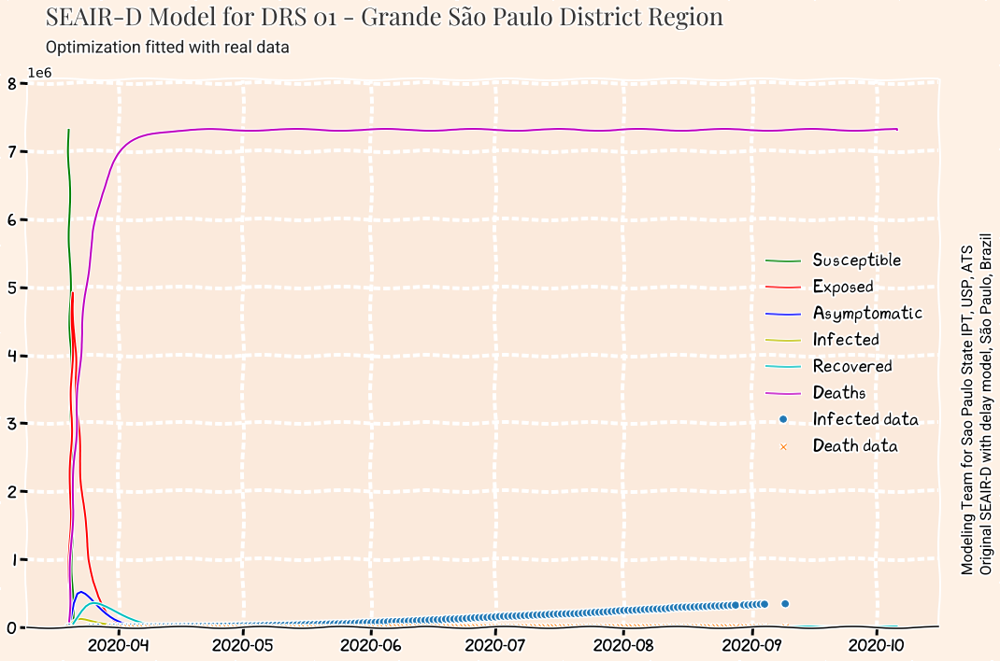

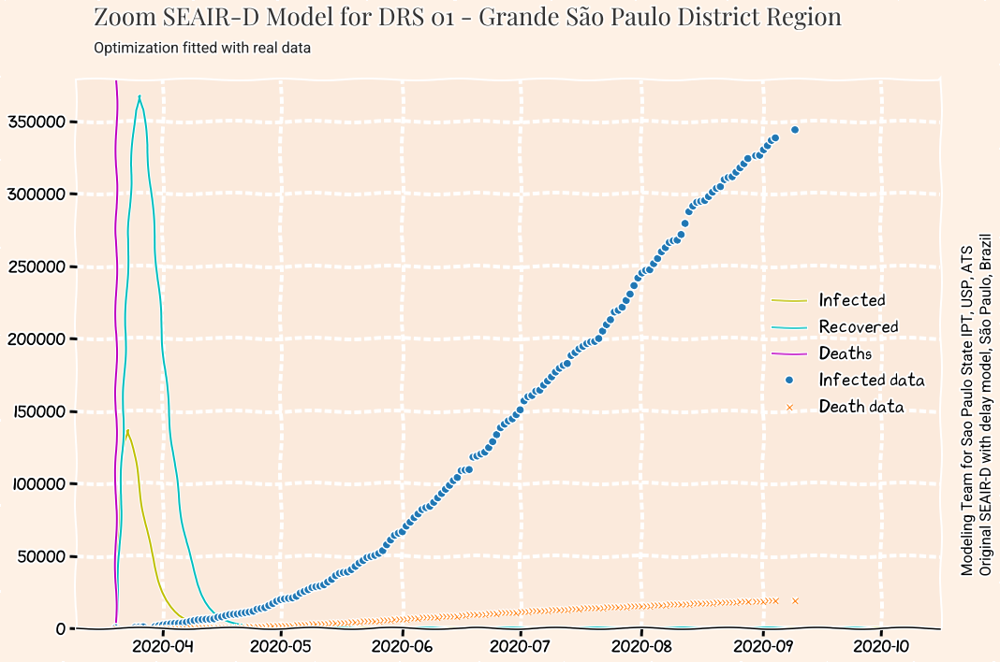

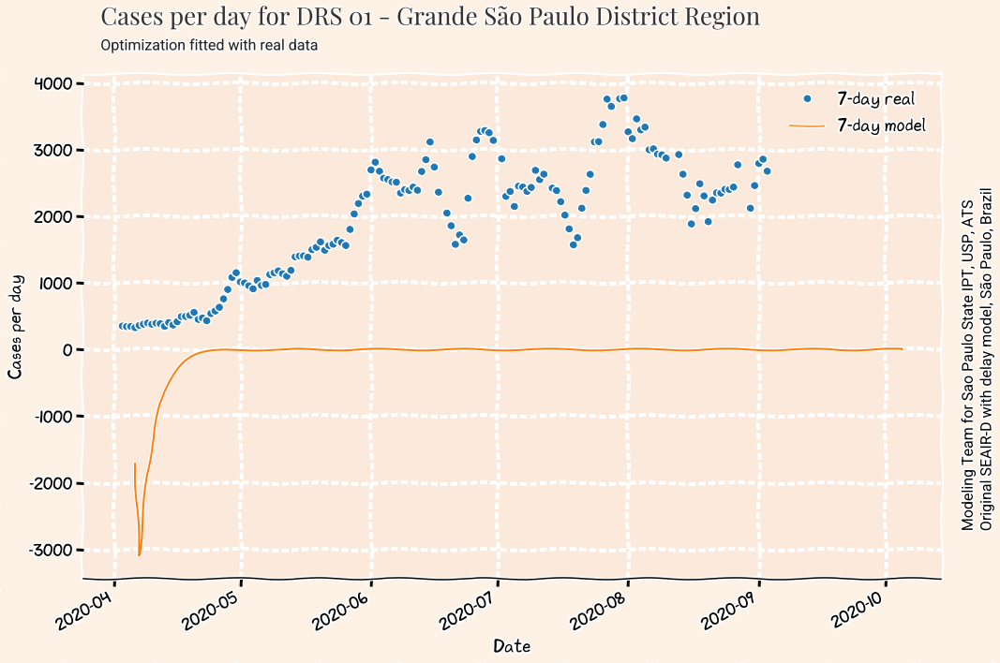

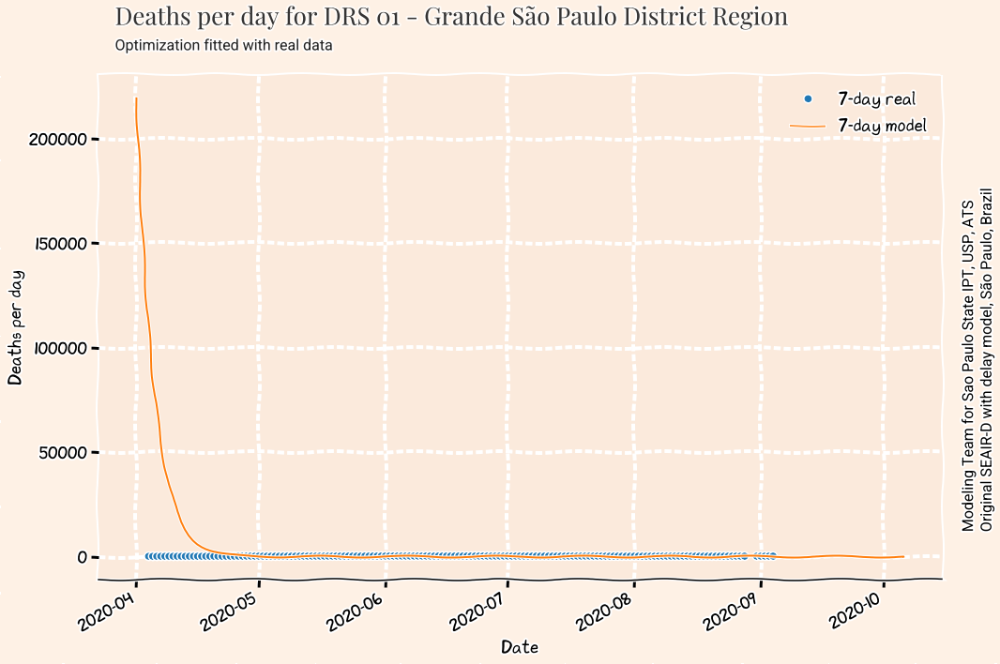

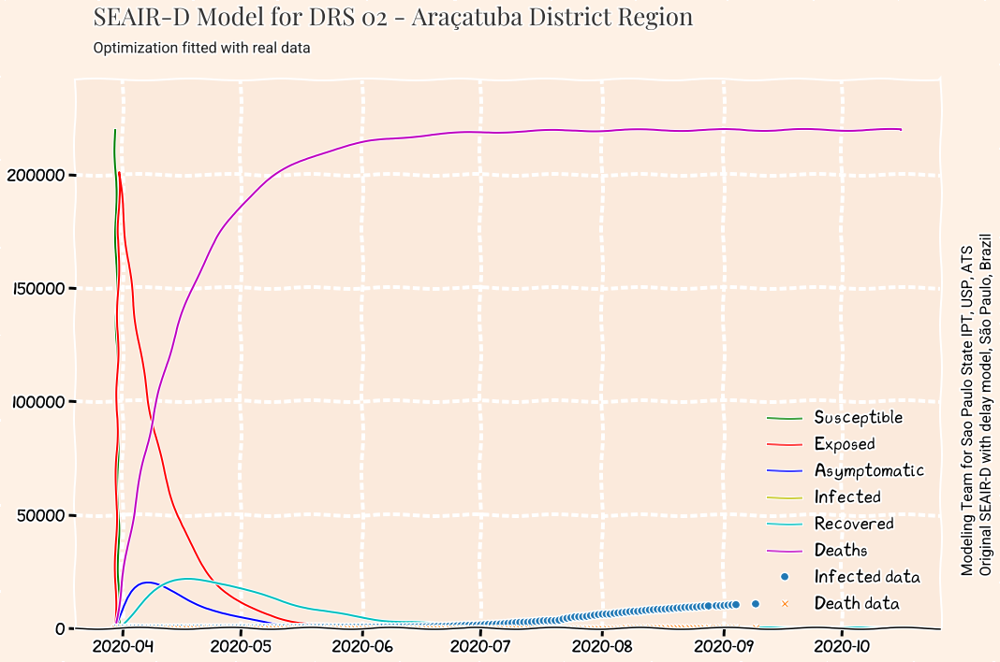

...

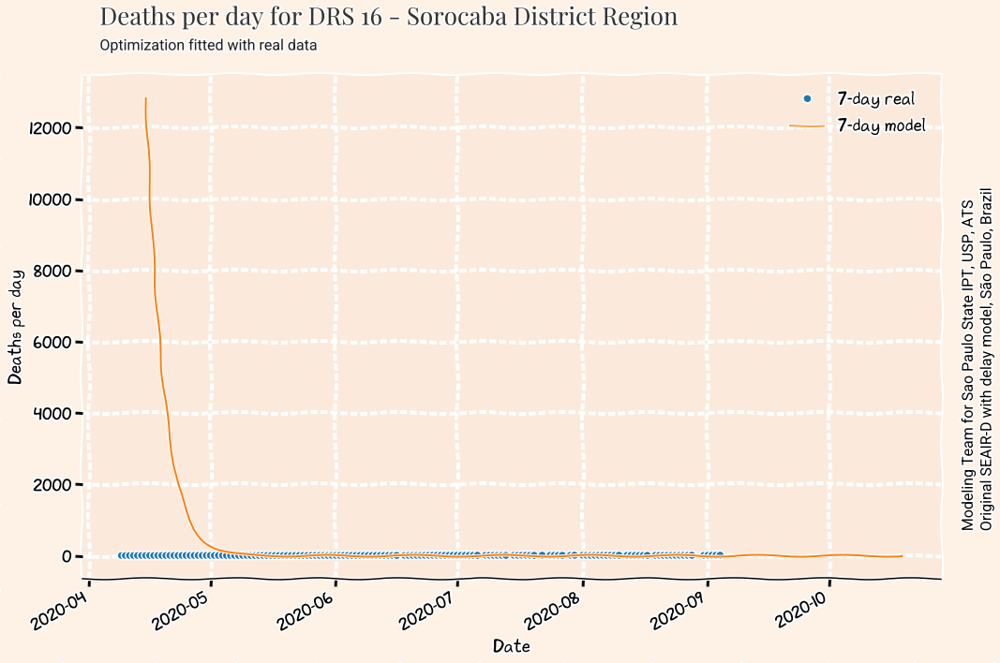

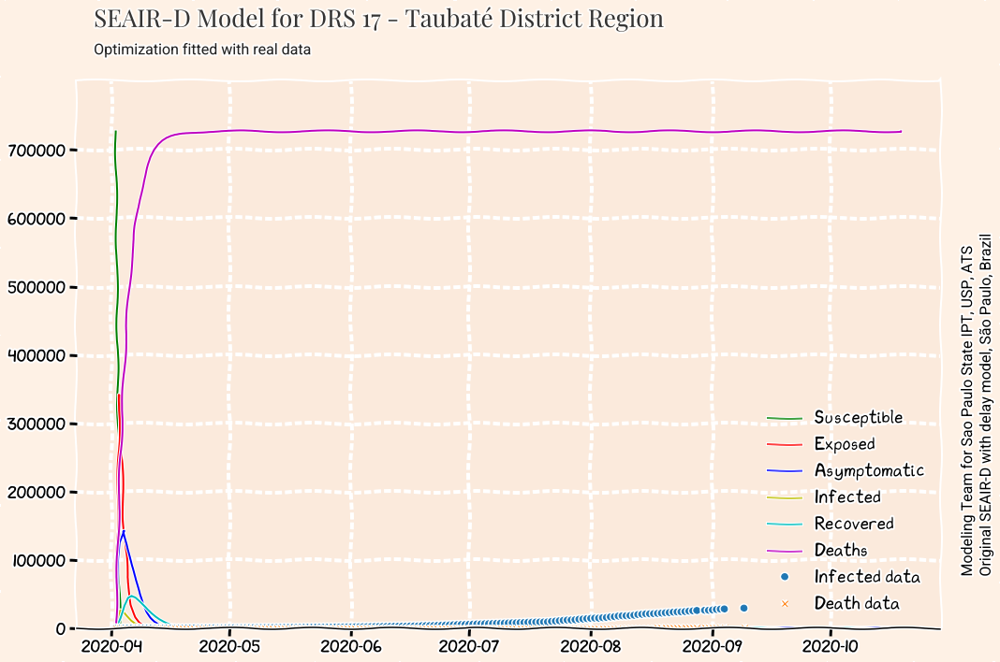

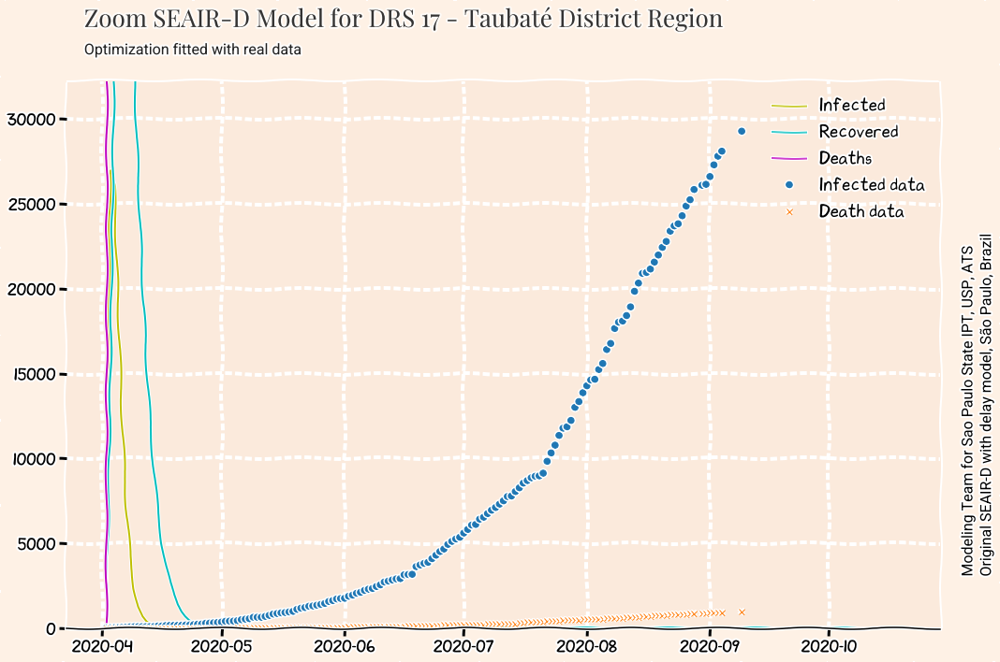

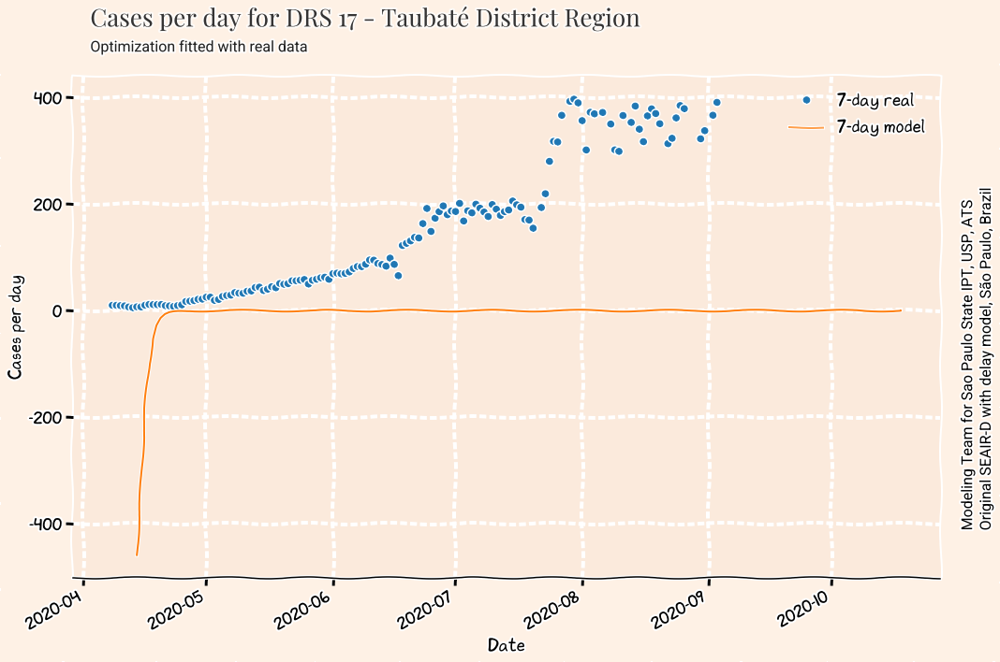

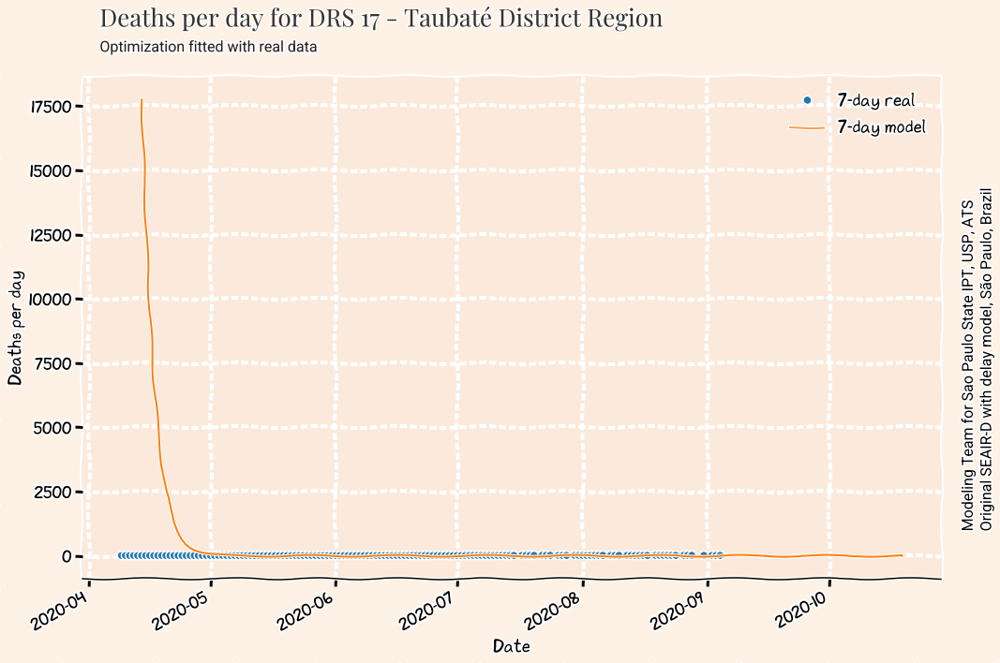

In [23]:
#plots one district or all districts  
if opt==5:
    allDistricts=True
else:
    allDistricts=False
    
if allDistricts:
    for districtRegion in DRS:
        query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
        ratio = query['RATIO'][0]
        startCase = query['START'][0]
        startdate = query['start-date'][0]
        predict_range = query['prediction-range'][0]
        
        #calcula data máxima dos gráficos
        #100 dias é usado como máximo dos cálculos da derivada das mortes
        lastDate=dfSP.date.max()
        maxDate= datetime.strptime(lastDate, "%Y-%m-%d") + timedelta(days = 100) #"2020-08-31"
        maxDateStr = maxDate.strftime("%Y-%m-%d")

        covid_plots.covid_plots(districtRegion, districts4Plot, startdate, predict_range, \
                        startCase, opt, version, show=True, ratio=ratio, maxDate=maxDateStr, model=model)
else: 
    query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
    ratio = query['RATIO'][0]
    startdate = query['start-date'][0]
    predict_range = query['prediction-range'][0]
    startCase = query['START'][0]
    
    #calcula data máxima dos gráficos
    #100 dias é usado como máximo dos cálculos da derivada das mortes
    lastDate=dfSP.date.max()
    maxDate= datetime.strptime(lastDate, "%Y-%m-%d") + timedelta(days = 100) #"2020-08-31"
    maxDateStr = maxDate.strftime("%Y-%m-%d")    
    
    covid_plots.covid_plots(districtRegion, districts4Plot, startdate, predict_range, \
                       startCase, opt, version, show=True, ratio=ratio, maxDate=maxDateStr, model=model)